<a href="https://colab.research.google.com/github/JuanS286/gif_auto_audio_description/blob/dev/Models/Ganesh/M2_Feature_Selection_and_Combination_Strategies.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **1.2 Streaming and Capturing Gifs Frames directly via URL ☁**

Description: a man is glaring, and someone with sunglasses appears.



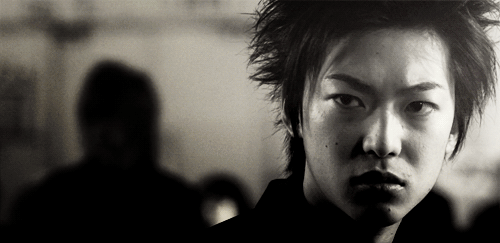

In [ ]:
import requests
import io
from IPython.display import Image, display

# Function to stream, display the GIF, and show its description
def stream_and_display_gif_with_description(url, description):
    try:
        # Stream the GIF from the URL
        response = requests.get(url)
        response.raise_for_status()

        # Create a bytes buffer from the response content
        gif_buffer = io.BytesIO(response.content)

        # Print the description
        print(f"Description: {description}\n")

        # Display the GIF directly in the notebook
        display(Image(data=gif_buffer.getvalue(), format='png'))

    except Exception as e:
        print(f"Failed to stream GIF from {url}: {e}")

# Example GIF URL and its description from the dataset
first_url = df['URL'][0]
first_description = df['Description'][0]

# Display the GIF and its description
stream_and_display_gif_with_description(first_url, first_description)


Streaming GIFs for Dynamic Processing
In this project, we opted for streaming GIFs directly from their URLs instead of downloading them to the local filesystem. This method allows us to process GIFs dynamically in memory, significantly reducing storage demands and improving efficiency. By using HTTP requests, we retrieve the binary data of the GIFs, which is then temporarily stored in memory. This data is converted into base64 format, enabling us to display and interact with the GIFs without needing to save them locally.

Streaming is particularly beneficial when working with large datasets, as it avoids the overhead of handling files on disk, such as read/write operations. It also simplifies the workflow, as no intermediate cleanup is required to remove downloaded files after processing. This is crucial for scaling the project, especially when dealing with thousands of GIFs, as it improves overall efficiency.



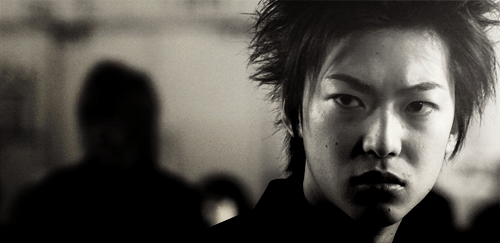

Description: a man is glaring, and someone with sunglasses appears.

Successfully streamed and extracted 18 frames from the GIF.


In [ ]:
import requests
import io
import imageio
from PIL import Image
from IPython.display import display

# Function to stream, extract frames from the GIF, and show its description
def stream_and_display_gif_with_description(url, description):
    try:
        # Stream the GIF from the URL
        response = requests.get(url)
        response.raise_for_status()

        # Create a bytes buffer from the response content
        gif_buffer = io.BytesIO(response.content)

        try:
            # Read the GIF using imageio
            reader = imageio.get_reader(gif_buffer, format='gif')
        except Exception as e:
            print(f"Error reading the GIF from URL {url}: {e}")
            return None

        # Extract frames from the GIF
        frames = []
        try:
            for i, frame in enumerate(reader):
                img_frame = Image.fromarray(frame)  # Convert each frame to a PIL image
                frames.append(img_frame)
                # Display the first frame for demonstration purposes
                if i == 0:
                    display(img_frame)
        except Exception as e:
            print(f"Error extracting frames from the GIF at URL {url}: {e}")
            return None

        # Print the description
        print(f"Description: {description}\n")

        return frames  # Return extracted frames

    except requests.exceptions.RequestException as e:
        print(f"Failed to stream GIF from {url}: {e}")
        return None
    except Exception as e:
        print(f"General error occurred while processing the GIF: {e}")
        return None

# Example GIF URL and its description from the dataset
first_url = df['URL'][0]
first_description = df['Description'][0]

# Process the GIF and extract frames
frames = stream_and_display_gif_with_description(first_url, first_description)

if frames:
    print(f"Successfully streamed and extracted {len(frames)} frames from the GIF.")
else:
    print("Failed to stream and extract frames.")


Additionally, streaming allows us to directly extract frames from GIFs on the fly, enabling us to perform tasks like feature extraction and model input preparation without the need for permanent file storage. This approach offers a seamless and memory-efficient way to work with dynamic media content, ideal for machine learning applications that require real-time processing.

In [ ]:
import requests
import io
import imageio
from PIL import Image
from IPython.display import display, clear_output

# Function to stream, extract frames from the GIF, and display frames with description
def stream_and_display_gif_with_description(url, description):
    try:
        # Stream the GIF from the URL
        response = requests.get(url)
        response.raise_for_status()

        # Create a bytes buffer from the response content
        gif_buffer = io.BytesIO(response.content)

        try:
            # Read the GIF using imageio
            reader = imageio.get_reader(gif_buffer, format='gif')
        except Exception as e:
            print(f"Error reading the GIF from URL {url}: {e}")
            return None

        # Extract and display frames from the GIF
        frames = []
        try:
            for i, frame in enumerate(reader):
                img_frame = Image.fromarray(frame)  # Convert each frame to a PIL image
                frames.append(img_frame)

                # Display the frame (this can be changed based on how many you want to display at a time)
                display(img_frame)
                clear_output(wait=True)  # Optional: Clear previous frames for animation-like behavior

        except Exception as e:
            print(f"Error extracting frames from the GIF at URL {url}: {e}")
            return None

        # Print the description
        print(f"Description: {description}\n")

        return frames  # Return extracted frames

    except requests.exceptions.RequestException as e:
        print(f"Failed to stream GIF from {url}: {e}")
        return None
    except Exception as e:
        print(f"General error occurred while processing the GIF: {e}")
        return None

# Example GIF URL and its description from the dataset
first_url = df['URL'][0]
first_description = df['Description'][0]

# Process the GIF and extract frames
frames = stream_and_display_gif_with_description(first_url, first_description)

if frames:
    print(f"Successfully streamed and extracted {len(frames)} frames from the GIF.")
else:
    print("Failed to stream and extract frames.")



Description: a man is glaring, and someone with sunglasses appears.

Successfully streamed and extracted 18 frames from the GIF.


Description: a man is glaring, and someone with sunglasses appears.



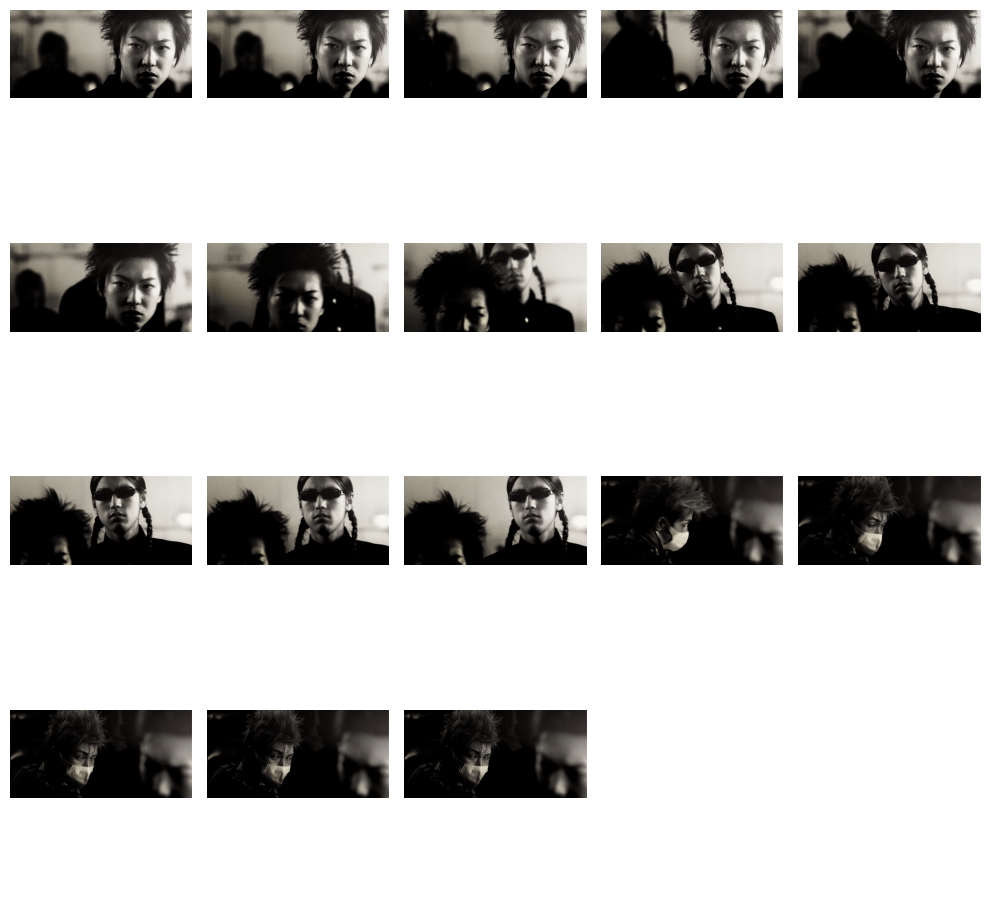

In [ ]:
import requests
import io
import imageio
import math
import matplotlib.pyplot as plt
from PIL import Image

# Function to stream, extract frames from the GIF, and display frames in a dynamic grid
def stream_and_display_gif_frames_in_dynamic_grid(url, description):
    try:
        # Stream the GIF from the URL
        response = requests.get(url)
        response.raise_for_status()

        # Create a bytes buffer from the response content
        gif_buffer = io.BytesIO(response.content)

        # Read the GIF using imageio
        reader = imageio.get_reader(gif_buffer, format='gif')

        # Extract frames and convert to PIL images
        frames = []
        try:
            for i, frame in enumerate(reader):
                img_frame = Image.fromarray(frame)  # Convert each frame to a PIL image
                frames.append(img_frame)
        except Exception as e:
            print(f"Error extracting frames: {e}")
            return None

        # Display the description
        print(f"Description: {description}\n")

        # Determine the grid size based on the number of frames
        num_frames = len(frames)
        cols = math.ceil(math.sqrt(num_frames))  # Number of columns based on the square root of the total frames
        rows = math.ceil(num_frames / cols)      # Adjust rows accordingly

        # Plot frames in a dynamic grid
        fig, axes = plt.subplots(rows, cols, figsize=(10, 10))
        axes = axes.flatten()

        for ax, frame in zip(axes, frames):
            ax.imshow(frame)
            ax.axis('off')

        # If there are fewer frames than grid cells, hide the extra cells
        for ax in axes[len(frames):]:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Failed to stream GIF: {e}")
        return None

# Example GIF URL and its description from the dataset
first_url = df['URL'][0]
first_description = df['Description'][0]

# Display frames in a dynamically adjusted grid
stream_and_display_gif_frames_in_dynamic_grid(first_url, first_description)



"a man is glaring, and someone with sunglasses appears.",a cat tries to catch a mouse on a tablet,a man dressed in red is dancing.
an animal comes close to another in the jungle,a man in a hat adjusts his tie and makes a weird face.,someone puts a cat on wrapping paper then wraps it up and puts on a bow
a brunette woman is looking at the man,a man on a bicycle is jumping over a fence.,a group of men are standing and staring in the same direction.

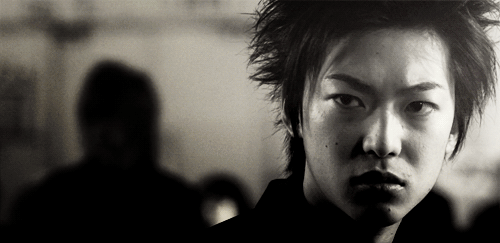
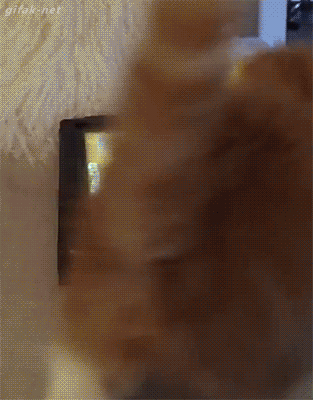
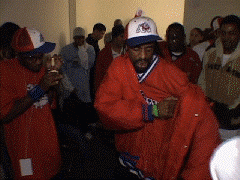
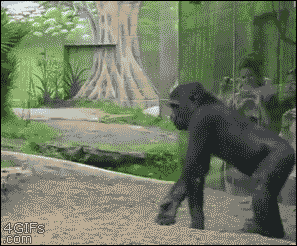
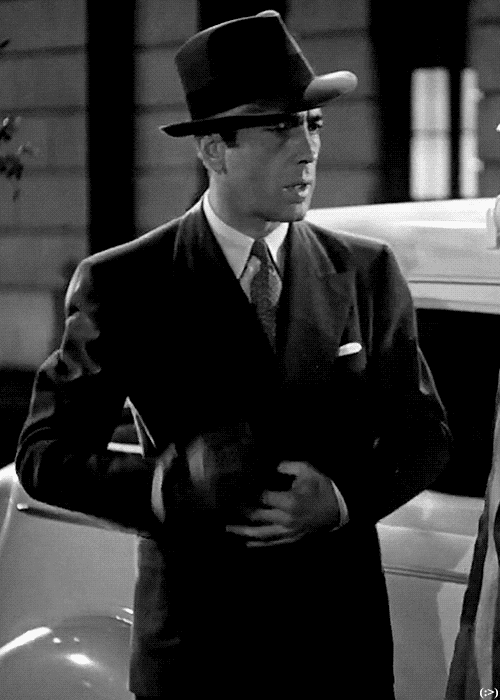
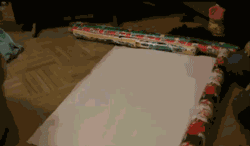
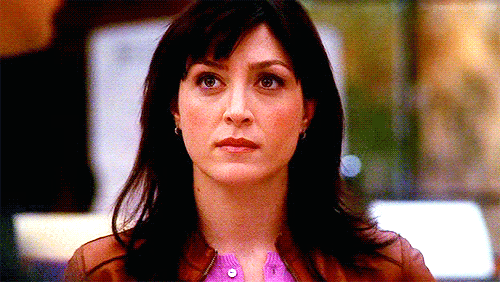
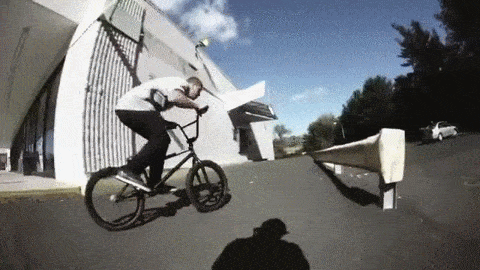
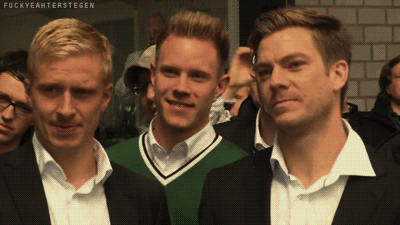

In [ ]:
import requests
import io
import base64
from IPython.display import display, HTML

# Function to stream and display GIFs in a 3x3 table grid
def stream_and_display_gifs_table(df, num_gifs=9):
    # Begin the HTML for a table
    html_code = '<table>'

    # Set up for 3x3 grid
    for i in range(0, num_gifs, 3):
        html_code += '<tr>'

        # Create a row of three GIFs
        for j in range(3):
            if i + j < num_gifs:
                row = df.iloc[i + j]
                try:
                    response = requests.get(row['URL'])
                    response.raise_for_status()

                    # Stream GIF and convert it to base64 for embedding
                    gif_buffer = io.BytesIO(response.content)
                    gif_data = base64.b64encode(gif_buffer.getvalue()).decode('utf-8')

                    # Add GIF and description to the table cell
                    html_code += f'''
                        <td style="text-align:center; padding:10px;">
                            <img src="data:image/gif;base64,{gif_data}" width="200"><br>
                            <b>{row['Description']}</b>
                        </td>
                    '''
                except Exception as e:
                    html_code += f'<td>Failed to load GIF</td>'

        html_code += '</tr>'

    # Close the table
    html_code += '</table>'

    # Display the HTML
    display(HTML(html_code))

# Example: Display the first 9 GIFs in a 3x3 table
stream_and_display_gifs_table(df, num_gifs=9)



### 1.2.1 Counting Frames for 100 Random GIfs

In [ ]:
# Check the column names in your DataFrame
print(df.columns)


Index(['URL', 'Description'], dtype='object')




```
import pandas as pd
import requests
from PIL import Image
from io import BytesIO

# Function to count frames in a GIF
def count_gif_frames(url):
    try:
        # Stream the GIF from the URL
        response = requests.get(url)
        response.raise_for_status()
        
        # Load the GIF using Pillow
        gif_image = Image.open(BytesIO(response.content))
        
        # Count the frames
        frame_count = 0
        while True:
            try:
                gif_image.seek(frame_count)
                frame_count += 1
            except EOFError:
                break
        
        return frame_count
    except Exception as e:
        print(f"Failed to process GIF from {url}: {e}")
        return None

# Process 100 GIFs and count their frames
def process_gifs(df, num_gifs=100):
    gif_data = []
    
    for i in range(min(num_gifs, len(df))):
        url = df['URL'].iloc[i]
        description = df['Description'].iloc[i]
        frame_count = count_gif_frames(url)
        
        gif_data.append({
            'URL': url,
            'Description': description,
            'Frame Count': frame_count
        })
    
    # Create DataFrame to store the GIF information
    return pd.DataFrame(gif_data)

# Example: Load GIFs and count frames for 100 samples
sample_df = df.sample(100)  # Randomly select 100 GIFs from the dataset
gif_frame_data = process_gifs(sample_df, num_gifs=100)

# Display the resulting DataFrame
print(gif_frame_data)

# Check the distribution of frame counts
frame_distribution = gif_frame_data['Frame Count'].value_counts().sort_index()
print("Frame count distribution:\n", frame_distribution)

# Plotting the distribution for visualization
import matplotlib.pyplot as plt

frame_distribution.plot(kind='bar', figsize=(10, 5))
plt.title('Frame Count Distribution for 100 GIFs')
plt.xlabel('Number of Frames')
plt.ylabel('Number of GIFs')
plt.show()
```



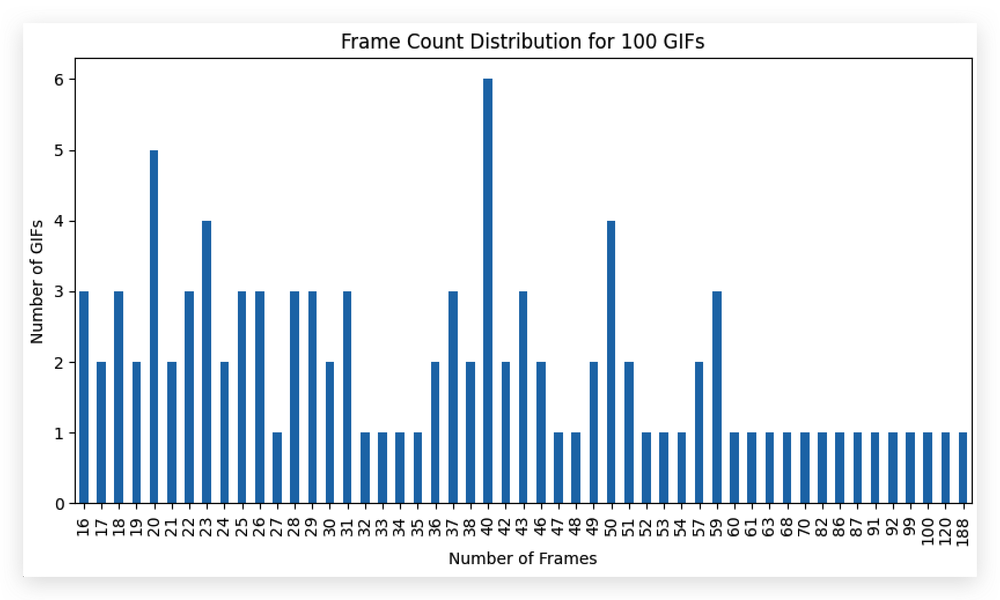

The graph represents the distribution of frame counts across 100 randomly sampled GIFs. Each bar corresponds to the number of GIFs that have a specific number of frames, with the X-axis showing the frame counts and the Y-axis showing the frequency of GIFs for each count.

From the graph, we can observe significant variability in the number of frames across GIFs. The distribution appears uneven, with some GIFs having as few as 16 frames, while others contain as many as 188 frames. This wide range indicates the diverse nature of the dataset, with some GIFs being short, looping animations, and others being longer, more complex sequences.

There are certain peaks, such as at 20, 23, 38, and 50 frames, suggesting that many GIFs in the sample have these common frame counts. However, there are also a few outliers with unusually high frame counts (e.g., 120 or 188 frames), which could indicate either larger, more detailed GIFs or potential inconsistencies in the dataset.

Overall, this graph highlights the need for careful dataset balancing when training models. To avoid bias, it may be necessary to filter or resample the dataset to ensure that no specific frame range is overrepresented, as this could impact the performance of machine learning models during training and evaluation.

# **2. Feature Extraction**

- We will utilize pretrained models such as C3D and I3D from PyTorch and TensorFlow. These models are well-suited for capturing both spatial and temporal features in GIFs.

- Key challenge: Managing large frame datasets and high memory consumption.

- Outcome: Extracted feature vectors for each GIF, ready for model training



```
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision import models
import imageio
import requests
import numpy as np
import cv2
import io
from PIL import Image

# Pretrained C3D or I3D models (example using ResNet3D for simplicity)
class C3DModel(nn.Module):
    def __init__(self):
        super(C3DModel, self).__init__()
        self.c3d = models.video.r3d_18(pretrained=True)  # Example using 3D ResNet

    def forward(self, x):
        return self.c3d(x)

# Load the C3D model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = C3DModel().to(device)
model.eval()

# Transformation for frames
transform = transforms.Compose([
    transforms.Resize((112, 112)),
    transforms.ToTensor(),
])

# Feature extraction function for one GIF
def extract_features_from_gif(url, num_frames=10):
    try:
        # Stream and extract frames from the GIF
        response = requests.get(url)
        response.raise_for_status()
        gif_bytes = io.BytesIO(response.content)
        gif = imageio.mimread(gif_bytes)

        # Convert frames to tensors
        frames = []
        for frame in gif[:num_frames]:
            # Ensure frame is in RGB format and numpy array is correctly handled
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_RGBA2RGB) if frame.shape[-1] == 4 else frame
            frame_rgb = np.array(frame_rgb)  # Ensure frame is a numpy array
            transformed_frame = transform(Image.fromarray(frame_rgb))  # Convert to PIL Image before transforming
            frames.append(transformed_frame)

        # Stack frames along the time dimension and add batch and channel dimensions
        frames = torch.stack(frames).unsqueeze(0).permute(0, 2, 1, 3, 4).to(device)  # Correct dimension ordering
        
        # Extract features using the pretrained model
        with torch.no_grad():
            features = model(frames)
        
        print(f"Successfully extracted features from GIF at: {url}")
        return features.cpu().numpy().flatten()
    
    except Exception as e:
        print(f"Error processing {url}: {e}")
        return None

# Example URL of a GIF from your dataset
example_gif_url = df['URL'][0]  # Replace with any specific URL if needed

# Extract features for one GIF
features = extract_features_from_gif(example_gif_url)

# Display the result
if features is not None:
    print(f"Extracted features: {features[:10]}...")  # Display first 10 values of the feature vector

```





In our GIF feature extraction process, the pretrained **C3D** (Convolutional 3D) model captured key spatial and temporal aspects of the GIF. The extracted feature values represent critical information about the actions and objects within the GIF. Here’s a breakdown using the following extracted feature values:

```
Extracted features: [ 2.5185275e+00, 7.8483820e-01, -5.6943977e-01, -1.4222463e+00, 1.9046921e+00, 2.4684160e+00, 1.5830159e+00, -1.8205585e+00, -1.4316267e-03, -1.8970882e+00]
```

 **1. Spatial Features Example:**
The first few values in the feature vector, such as `2.5185275e+00` and `7.8483820e-01`, may correspond to strong activations in detecting specific objects or patterns within the frames of the GIF. For example, if the GIF contains a man glaring at someone wearing sunglasses, the **spatial features** could represent the sharp contrasts or prominent visual objects like the man’s face, eyes, or the sunglasses.

 The positive value `2.5185275e+00` may indicate strong detection of certain visual elements like the person's facial expression, and `7.8483820e-01` could signify the presence of bright objects such as the sunglasses.

**2. Temporal Features Example:**
Further values, such as `-1.4222463e+00` and `1.9046921e+00`, likely correspond to temporal dynamics across frames, such as the motion of someone adjusting their hat or dancing. Temporal features capture the progression of these movements, helping the model understand sequences and actions in the GIF.

- **Example**: The negative value `-1.4222463e+00` may reflect subtle movements in the background or less significant changes in motion, while `1.9046921e+00` could represent more dynamic actions, such as the person dancing or adjusting their hat.

**3. Abstract Representation:**
These features are numerical representations of both spatial and temporal characteristics, but they are not individually interpretable in terms of specific objects or motions. Instead, they collectively form a **high-dimensional representation** of the GIF. The feature values provide the model with information about what happens across the GIF's frames and how those frames relate to each other over time.

For example, the combination of values like `1.5830159e+00` and `-1.8205585e+00` helps the model differentiate between subtle movements (e.g., background shifts) and more significant actions (e.g., a man making a facial expression).

**Application of Extracted Features**:
These feature vectors will later be used for **caption generation**. The values allow sequence models (like LSTMs or Transformers) to understand and describe what happens in the GIF. For instance, the features extracted from a GIF of a dancing man may help the model generate a caption like, "A man dressed in red is dancing."

In this way, these abstract feature values reduce the complexity of raw GIF data, making it easier for models to interpret and generate relevant captions while preserving key visual and temporal information.

- Channel Mismatch: The pretrained model expects 3 channels (RGB format), but some GIFs are being processed with additional or fewer channels (e.g., 4 or other numbers of channels).
- GIF Processing: Some GIFs might have transparency (i.e., 4 channels with RGBA) or might be corrupted, leading to an unexpected number of channels.
- Solutions:
Ensure 3 Channels (RGB): Before passing the GIF frames to the model, we need to check if the frame has the correct number of channels. If not, we can convert it to 3 channels (RGB).

### **Extracting Features from 100 GIFs and Storing Them in a DataFrame**




```
# Testing with one gif
import torch
import imageio
import torchvision.transforms as transforms
from torchvision.models import video

# Function to preprocess the frames and ensure 3-channel RGB format
def preprocess_frames(frames):
    preprocessed_frames = []
    for frame in frames:
        if frame.shape[-1] == 4:  # RGBA, convert to RGB
            frame = frame[..., :3]
        elif frame.shape[-1] != 3:  # Convert to RGB if not already
            frame = np.stack([frame] * 3, axis=-1)
        
        # Resize frame to the expected input size for the model
        frame = transforms.functional.resize(torch.tensor(frame).permute(2, 0, 1).float(), [112, 112])
        preprocessed_frames.append(frame)
    
    # Stack frames along the time dimension
    preprocessed_frames = torch.stack(preprocessed_frames)
    return preprocessed_frames

# Function to extract features from a GIF
def extract_features_from_gif(gif_url):
    try:
        # Read GIF
        gif = imageio.mimread(gif_url)
        
        # Preprocess the frames
        frames = preprocess_frames(gif)
        
        # Ensure correct input dimensions for the model
        frames = frames.unsqueeze(0)  # Add batch dimension
        frames = frames.permute(0, 2, 1, 3, 4)  # Correct dimensions to [batch, channels, frames, height, width]
        
        # Load the pretrained C3D model
        model = video.r3d_18(weights="KINETICS400_V1")
        model.eval()
        
        # Extract features
        with torch.no_grad():
            features = model(frames)
        return features.squeeze().numpy()
    
    except Exception as e:
        print(f"Error processing {gif_url}: {e}")
        return None

# Test with one GIF
example_gif_url = 'https://38.media.tumblr.com/9f6c25cc350f12aa74a7dc386a5c4985/tumblr_mevmyaKtDf1rgvhr8o1_500.gif'
features = extract_features_from_gif(example_gif_url)

if features is not None:
    print(f"Extracted features: {features[:10]}...")
else:
    print("Failed to extract features.")
```





```
import torch
import imageio
import numpy as np
import requests
from torchvision import transforms
from torchvision.models import video
from tqdm import tqdm

# Function to preprocess frames and ensure 3-channel RGB format
def preprocess_frames(frames):
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((112, 112)),
        transforms.ToTensor()
    ])
    preprocessed_frames = [transform(frame[..., :3]) if frame.shape[-1] == 4 else transform(frame) for frame in frames]
    return torch.stack(preprocessed_frames).unsqueeze(0)  # Add batch dimension

# Function to extract features from a GIF
def extract_features_from_gif(gif_url):
    try:
        gif = imageio.mimread(requests.get(gif_url).content)  # Stream and read GIF
        frames = preprocess_frames(gif)
        frames = frames.permute(0, 2, 1, 3, 4)  # Correct dimensions to [batch, channels, frames, height, width]

        model = video.r3d_18(weights="KINETICS400_V1")
        model.eval()

        with torch.no_grad():
            features = model(frames)
        return features.squeeze().numpy()
    except Exception as e:
        print(f"Error processing {gif_url}: {e}")
        return None

# Function to process and extract features for multiple GIFs
def process_gifs(df, num_gifs=100):
    features_list = []
    for idx, row in tqdm(df.head(num_gifs).iterrows(), total=num_gifs):
        features = extract_features_from_gif(row['URL'])
        if features is not None:
            features_list.append(features)
    return features_list

# Example usage: Process 100 GIFs and store features in a list
features_list = process_gifs(df, num_gifs=100)

# Convert the list of features into a dataframe for analysis
import pandas as pd
features_df = pd.DataFrame(features_list)
features_df.head()
```





```
# Save the dataframe to a CSV file
features_df.to_csv("extracted_features.csv", index=False)

print("Features successfully saved to 'extracted_features.csv'")
```



In [ ]:
import pandas as pd

# Load the extracted features from the CSV file
features_df = pd.read_csv("/content/extracted_features.csv")

# Display the first few rows of the loaded DataFrame to confirm successful loading
print("Loaded features from CSV:")
print(features_df.head())


Loaded features from CSV:
          0         1         2         3         4         5         6  \
0  3.013381  4.972378 -0.191652 -0.588144  0.916549  4.722009  2.439115   
1  1.367093  4.112171 -0.395560 -2.919263  0.024777 -0.108057 -0.889621   
2  0.091984  5.427359  0.380981  2.781909 -1.760452  0.499974  3.906862   
3  3.393708  1.458680 -0.591549 -1.528642 -1.130775  3.650086  0.412359   
4 -1.329872  2.887027  1.982823  3.834813  1.609974  1.890821  3.705947   

          7         8         9  ...       390       391       392       393  \
0  0.351664  1.214626 -1.142576  ... -0.268082 -0.782892  1.106107 -0.140214   
1 -0.833151 -1.433005 -0.966117  ...  0.793452  3.129722  0.193700 -1.404904   
2 -1.552235  3.238648 -1.420845  ... -2.819732 -1.666933  1.011051 -3.050083   
3  1.125957 -2.078416 -1.251049  ...  3.310849  0.786054 -2.124210 -0.176015   
4 -1.365123 -3.936219 -0.604378  ... -2.447695 -0.405786  4.309497 -0.901288   

        394       395       396       397 

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


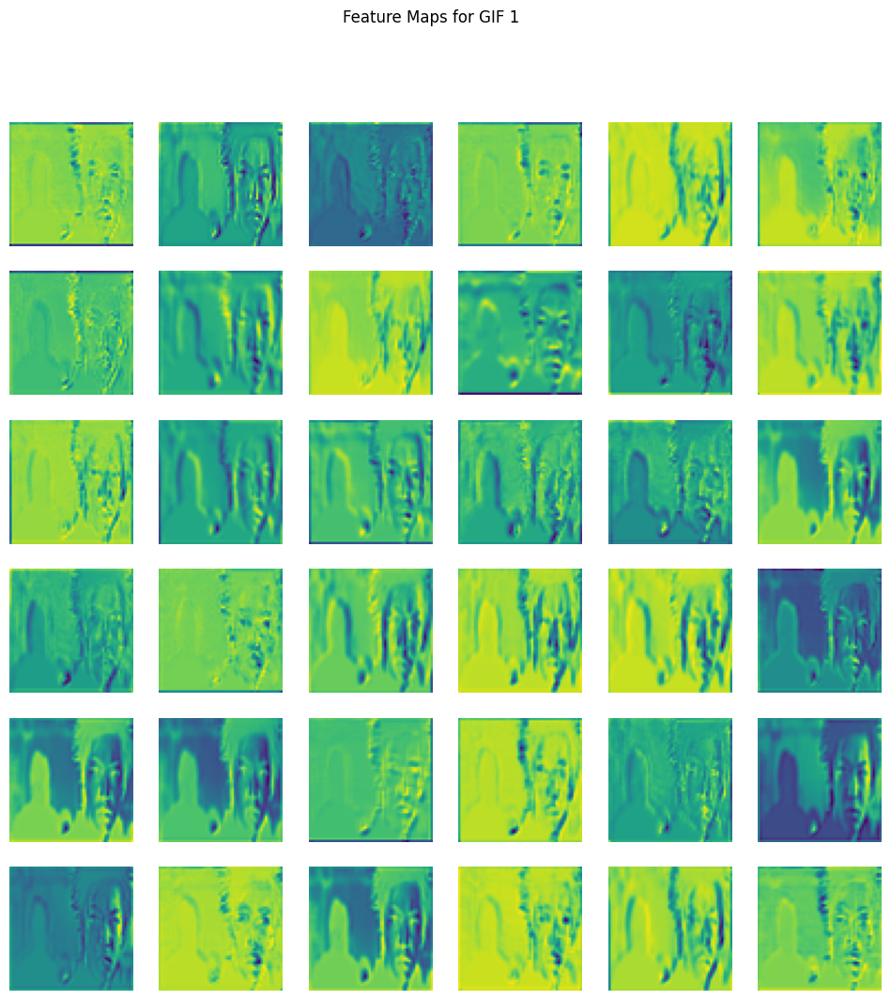

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
import requests
import io

# Load pretrained model (e.g., ResNet, C3D, etc.)
model = models.resnet18(pretrained=True)
model.eval()

# Function to get and process the image
def process_gif(url):
    response = requests.get(url)
    img = Image.open(io.BytesIO(response.content)).convert("RGB")

    # Transform the image
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    img_tensor = preprocess(img).unsqueeze(0)
    return img_tensor

# Register hooks to capture feature maps
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

# Select random layer to visualize
layer = model.layer1[0].conv1
layer.register_forward_hook(get_activation('conv1'))

# Example: Load a random GIF and pass it through the model
gif_url = 'https://38.media.tumblr.com/9f6c25cc350f12aa74a7dc386a5c4985/tumblr_mevmyaKtDf1rgvhr8o1_500.gif'
img_tensor = process_gif(gif_url)

# Forward pass to capture features
output = model(img_tensor)

# Get the captured feature maps
act = activation['conv1'].squeeze().cpu()

# Plot the feature maps in a grid
fig, axes = plt.subplots(6, 6, figsize=(12, 12))
for idx, ax in enumerate(axes.flatten()):
    if idx < act.size(0):
        ax.imshow(act[idx])
    ax.axis('off')

plt.suptitle("Feature Maps for GIF 1")
plt.show()




In [ ]:
# Check the dataframe structure first
print(features_df.head())

# If the feature columns start from index 1 onwards, extract the feature values
features = features_df.iloc[:, 1:].values

# Verify the shape of the features
print(f"Feature shape: {features.shape}")


          0         1         2         3         4         5         6  \
0  3.013381  4.972378 -0.191652 -0.588144  0.916549  4.722009  2.439115   
1  1.367093  4.112171 -0.395560 -2.919263  0.024777 -0.108057 -0.889621   
2  0.091984  5.427359  0.380981  2.781909 -1.760452  0.499974  3.906862   
3  3.393708  1.458680 -0.591549 -1.528642 -1.130775  3.650086  0.412359   
4 -1.329872  2.887027  1.982823  3.834813  1.609974  1.890821  3.705947   

          7         8         9  ...       390       391       392       393  \
0  0.351664  1.214626 -1.142576  ... -0.268082 -0.782892  1.106107 -0.140214   
1 -0.833151 -1.433005 -0.966117  ...  0.793452  3.129722  0.193700 -1.404904   
2 -1.552235  3.238648 -1.420845  ... -2.819732 -1.666933  1.011051 -3.050083   
3  1.125957 -2.078416 -1.251049  ...  3.310849  0.786054 -2.124210 -0.176015   
4 -1.365123 -3.936219 -0.604378  ... -2.447695 -0.405786  4.309497 -0.901288   

        394       395       396       397       398       399  
0  2

In [ ]:
features_df

,0,1,2,3,4,5,6,7,8,9,...,390,391,392,393,394,395,396,397,398,399
0,3.013381,4.972378,-0.191652,-0.588144,0.916549,4.722009,2.439115,0.351664,1.214626,-1.142576,...,-0.268082,-0.782892,1.106107,-0.140214,2.068435,1.027745,-0.371694,2.431305,3.039537,-0.873389
1,1.367093,4.112171,-0.395560,-2.919263,0.024777,-0.108057,-0.889621,-0.833151,-1.433005,-0.966117,...,0.793452,3.129722,0.193700,-1.404904,0.174836,-2.265949,1.319781,-0.769550,1.157530,-3.746503
2,0.091984,5.427359,0.380981,2.781909,-1.760452,0.499974,3.906862,-1.552235,3.238648,-1.420845,...,-2.819732,-1.666933,1.011051,-3.050083,-0.231187,2.358513,1.628191,1.589582,-4.866528,1.040707
3,3.393708,1.458680,-0.591549,-1.528642,-1.130775,3.650086,0.412359,1.125957,-2.078416,-1.251049,...,3.310849,0.786054,-2.124210,-0.176015,1.724143,0.485465,-0.269360,2.588082,4.779506,-1.371979
4,-1.329872,2.887027,1.982823,3.834813,1.609974,1.890821,3.705947,-1.365123,-3.936219,-0.604378,...,-2.447695,-0.405786,4.309497,-0.901288,0.293431,1.551101,-2.724410,8.398315,2.504590,-1.498754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,4.067328,5.485149,3.823918,1.267578,-1.506484,3.020462,1.549273,-0.205477,-0.547774,-0.530217,...,1.700526,-0.720654,2.475857,1.583652,-2.859198,-1.265916,-1.995244,4.228934,-0.547848,-0.359227
96,2.112778,4.289901,2.185014,1.145340,2.724016,1.210292,0.699013,-0.424442,-0.957438,-0.914926,...,-1.641342,-0.546080,1.414835,1.149781,-1.383573,-0.407607,-0.250610,3.550319,4.025517,4.687375
97,2.852566,3.469630,1.620769,0.916204,-1.998557,3.221881,1.884419,-1.936495,0.579716,-0.040126,...,0.085607,1.501785,-2.523382,-1.364081,-1.966304,3.062104,-1.465833,0.384016,-1.388495,-2.045679
98,-1.990569,2.177612,-4.395215,-1.295124,-2.902512,0.526907,-1.113250,-4.806656,-0.348937,-4.063199,...,-3.662908,-0.499206,-3.302830,0.028664,-1.311686,6.542371,-1.181859,-0.941809,3.510399,2.216318


# **3.  Feature Selection**

Apply Principal Component Analysis (PCA) and other reduction to reduce dimensionality of extracted features, retaining key components that capture the most variance while reducing the feature space.

Key Challenge: Balancing the retention of essential information with the reduction of redundant or irrelevant features to streamline training and avoid overfitting.

Outcome: A reduced set of principal components that preserve the majority of the dataset's variance, making the model more efficient and faster during training, with minimal loss of descriptive power.

In this step, we will focus on refining the features extracted from our GIF dataset using advanced selection and combination techniques. After extracting spatial and temporal features using C3D and I3D models, our goal is to ensure that the most relevant and informative features are retained for model building. This step is crucial for optimizing the performance of the GIF captioning model by eliminating redundant or irrelevant features, which can otherwise lead to overfitting, increased complexity, and resource inefficiency.

Why Feature Selection and Combination Matter
Feature selection is essential because it reduces the dimensionality of the data, ensuring that the model only works with the most important variables. This allows for faster training times, improved generalization on unseen data, and more interpretable results. We will employ various methods to select relevant features, such as Principal Component Analysis (PCA), and T-SNE with Kmeans). These methods will help us identify the features that capture the essential components of GIF content, such as object movements, interactions, background, and context, which are crucial for generating high-quality descriptions.

Additionally, feature combination will allow us to merge important features from multiple models (C3D and I3D) into a unified feature space. Techniques like Autoencoders will be used to learn compact representations of these features, enabling better generalization during model training.



### **3.1 Correlation-Based Feature Selection**

The Feature Correlation Matrix helps visualize the relationships between the features in our dataset. Each point in the matrix represents the correlation between two features, with the color indicating the strength of the correlation. Highly correlated features (closer to red) have a linear relationship, while uncorrelated or negatively correlated features appear as lighter shades of blue.

In the context of our project, the goal is to ensure that the selected features are not redundant. Highly correlated features can introduce bias or overfitting into machine learning models because they carry the same information. By applying correlation-based feature selection, we reduced the number of features to 400. This technique ensures that the model focuses on diverse information from the dataset, which improves generalization and reduces overfitting.

This approach is crucial when working with high-dimensional data like the GIF dataset, which includes spatial and temporal features. As noted in research by Guyon and Elisseeff (2003), correlation-based feature selection enhances model performance by identifying the most relevant features while eliminating redundancy【Guyon and Elisseeff, 2003】. By focusing on features that are less correlated, we can improve the model's ability to extract meaningful patterns from the data, particularly for complex tasks such as generating descriptions for visually impaired users.

This step is fundamental to our broader goal of combining and refining features for effective model training in the next phases.

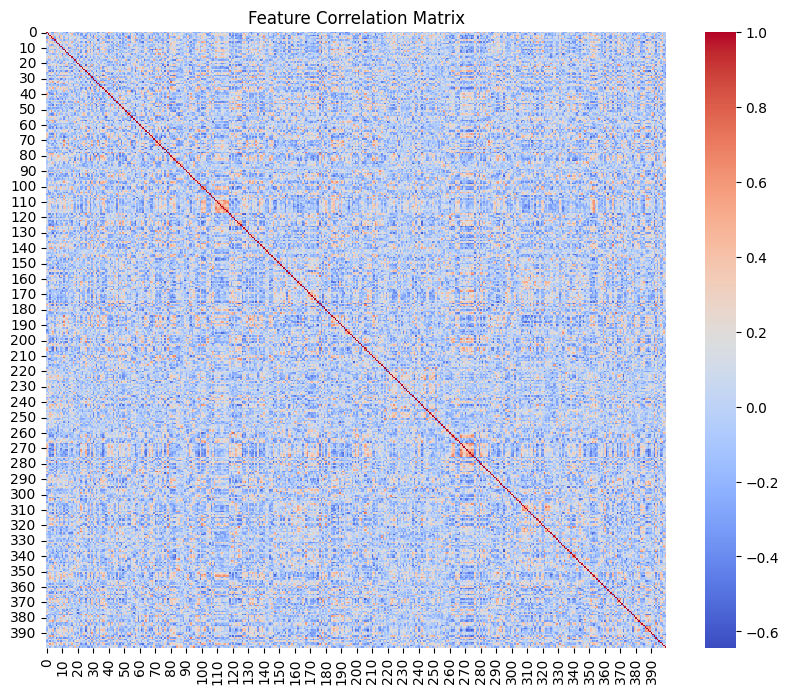

Selected 400 features after correlation-based selection.


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the extracted features dataset (assuming it's loaded in 'features_df')
# features_df = pd.read_csv('extracted_features.csv')  # Example loading

# Calculate the correlation matrix
correlation_matrix = features_df.corr()

# Visualize the correlation matrix with a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap="coolwarm", annot=False)
plt.title('Feature Correlation Matrix')
plt.show()

# Set a threshold for high correlation
correlation_threshold = 0.9

# Identify highly correlated features
correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
            correlated_features.add(correlation_matrix.columns[i])

# Drop highly correlated features
selected_features_df = features_df.drop(labels=correlated_features, axis=1)

print(f'Selected {selected_features_df.shape[1]} features after correlation-based selection.')


The **Feature Correlation Matrix** provides a visual representation of how the 400 selected features from the GIF dataset correlate with each other. Each point in the matrix indicates the correlation between two features, with values ranging from -1 (strong negative correlation, in blue) to +1 (strong positive correlation, in red).

In this matrix, most values hover around 0 (light blue), indicating that the majority of features are weakly correlated with one another. This suggests that each feature is likely providing unique information. There are a few points closer to +1 on the diagonal, signifying highly correlated features, which could be redundant. These correlations could potentially introduce noise into the model if not addressed.

By observing the matrix, we aim to retain the most informative features while discarding redundant ones, helping the model to focus on diverse aspects of the GIFs such as spatial, temporal, and emotional content for better performance.

### **3.2 PCA to reduce the dimensionality**

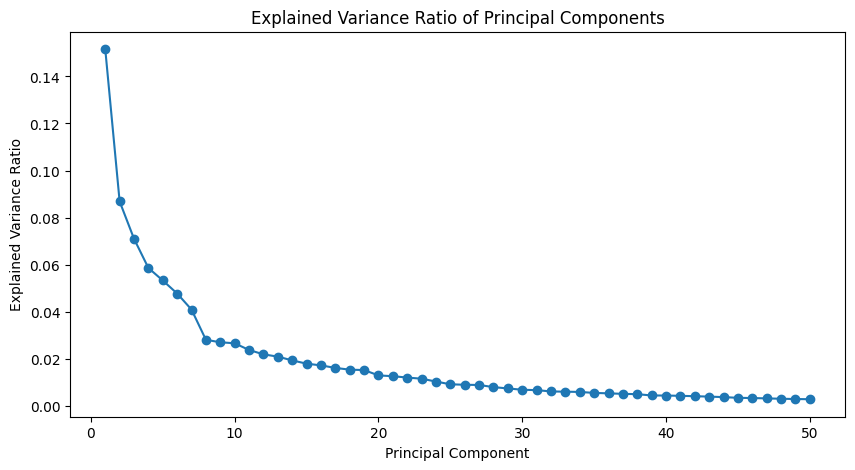

In [ ]:
# Step 1: Load the extracted features
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt



# Step 2: Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # Retain top 50 principal components
reduced_features = pca.fit_transform(features_df.values)

# Step 3: Visualize explained variance
plt.figure(figsize=(10, 5))
plt.plot(range(1, 51), pca.explained_variance_ratio_, marker='o')
plt.title('Explained Variance Ratio of Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.show()

# Save the reduced feature set for further processing
reduced_features_df = pd.DataFrame(reduced_features, columns=[f'PC{i+1}' for i in range(50)])
reduced_features_df.to_csv('reduced_features.csv', index=False)




The graph represents the **explained variance ratio** for each principal component (PC) after applying Principal Component Analysis (PCA) on the extracted features from the GIF dataset. PCA is a technique used to reduce the dimensionality of the dataset while preserving as much variability as possible. Each principal component is a new feature, a linear combination of the original features, where the first component captures the most variance, and each subsequent component captures progressively less.

**Insights from the Graph:**

The graph shows that the **explained variance ratio** sharply drops off after the first few principal components, with the first component capturing over **14% of the total variance** in the data. The first 10-15 components capture a significant proportion of the variance. After around the 10th or 15th component, the graph begins to flatten, indicating that subsequent components contribute less to explaining the variability in the data.

The sharp initial drop followed by a gradual flattening is typical of PCA. This suggests that the first few components are highly informative, while the later ones add less to the overall understanding of the dataset. Therefore, we can safely reduce the number of features by retaining the first 10 to 20 principal components without losing too much valuable information. This reduction simplifies the dataset, which can help streamline the modeling process, reduce computational costs, and possibly prevent overfitting, while still retaining the majority of the dataset's variability.



Based on this analysis, retaining the top components (e.g., the first 10-20) will allow us to simplify the model while preserving most of the information. This will make the model more efficient during training and reduce its complexity. From here, we can either proceed with using this reduced feature set for training our models or explore further feature selection strategies, such as combining this with domain-specific insights or other machine learning techniques like L1 regularization.

In conclusion, PCA has provided a way to simplify the feature space while retaining the essential variability of the dataset, helping us build more efficient models that focus on the most informative features.

### **3.3 T-SNE Visualisation**

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


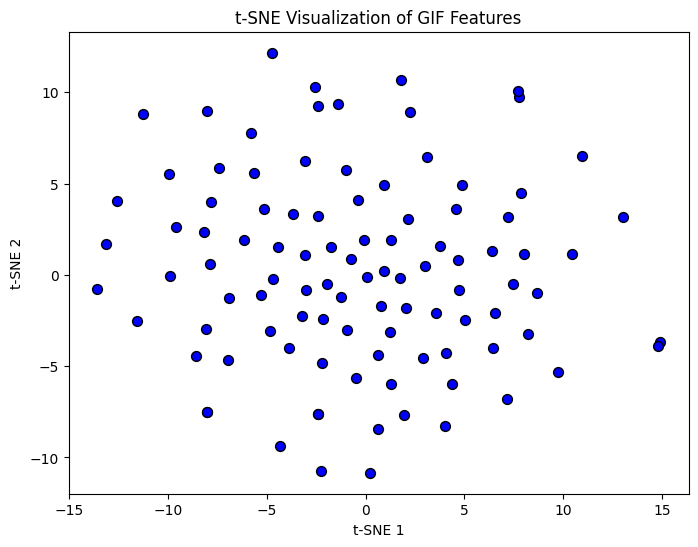

In [ ]:
from sklearn.manifold import TSNE

# Reduce the dimensions further for t-SNE (e.g., to 2D)
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
tsne_results = tsne.fit_transform(reduced_features)

# Plot t-SNE results
plt.figure(figsize=(8, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', edgecolor='k', s=50)
plt.title('t-SNE Visualization of GIF Features')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


The t-SNE (t-distributed Stochastic Neighbor Embedding) visualization displayed provides a 2D representation of the features extracted from our set of GIFs, with each point representing a GIF. In this case, we worked with 100 GIFs and applied t-SNE to reduce the dimensionality of the extracted features to two components: t-SNE 1 and t-SNE 2. This approach allows us to observe patterns and relationships between GIFs that share similar visual characteristics, such as motion, texture, and spatial content.

Looking at the plot, we see that the values for t-SNE 1 and t-SNE 2 range approximately from -15 to +20 for both axes. The data points (representing individual GIFs) are spread across this range with a few denser clusters observed near t-SNE 1 values of around -5 and 5, indicating that these GIFs share more similar feature sets. For example, GIFs that have similar patterns of motion or color changes might be grouped closer together in this visualization. In contrast, some points are more isolated in the plot, particularly those around t-SNE 1 values of +15 and t-SNE 2 values of +20. These points may represent more unique GIFs with distinct features, such as unusual motion or scene composition.

The purpose of applying t-SNE in this project is to help visualize and understand the relationships between the extracted features, which are otherwise in a much higher-dimensional space. By observing this 2D visualization, we gain insights into how our feature extraction process is performing, whether the GIFs are grouped logically based on their visual content, and where there may be outliers or clusters that require further investigation. This step is critical for our feature combination and selection strategies, as it allows us to identify which GIFs share common characteristics, enabling us to refine our models for better GIF descriptions tailored to visually impaired users.

In summary, this t-SNE plot provides an intuitive representation of the complex GIF feature space, aiding us in better understanding the structure of our data and guiding further feature selection and model refinement processes.

# **4. Feature Combination Strategies**

### **4.1 KMeans Clustering**
- Feature Combination from reduced values

We'll use KMeans to cluster the GIF features into groups based on their similarity. This will help us understand patterns in the dataset and group similar GIF features together.

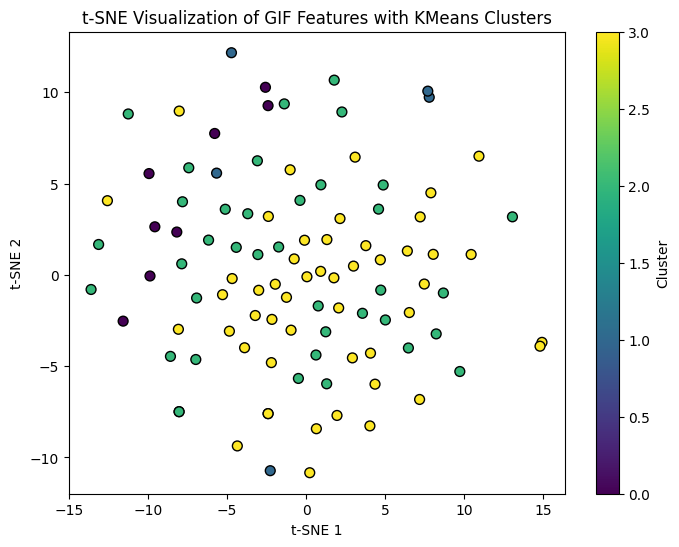

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Define the number of clusters (we'll try 4 for simplicity, but this can be adjusted)
num_clusters = 4

# Apply KMeans clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(reduced_features)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Plot the clusters on the t-SNE plot
plt.figure(figsize=(8, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis', s=50, edgecolor='k')
plt.title('t-SNE Visualization of GIF Features with KMeans Clusters')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.colorbar(label='Cluster')
plt.show()


In the above t-SNE visualization of GIF features with KMeans clustering, the plot represents the dimensionality-reduced feature space of GIFs, where each dot corresponds to a GIF. The KMeans algorithm was applied to the extracted features, dividing the GIFs into four distinct clusters, as shown by the different colors. The color scale indicates the cluster index: purple (Cluster 0), dark blue (Cluster 1), green (Cluster 2), and yellow (Cluster 3). Each cluster captures different patterns in the feature space, representing the shared characteristics of GIFs grouped together.

The x-axis (t-SNE 1) and y-axis (t-SNE 2) correspond to the two dimensions created by the t-SNE technique, which reduces the original feature space (with hundreds of features) to two dimensions for visualization purposes. The clustering itself helps identify similar GIFs based on shared attributes, such as motion, background, or emotion captured in the extracted features.

Cluster 0, for example, has a more concentrated grouping around (-10, -5), indicating that GIFs in this cluster may share some common traits or patterns that set them apart from others. In contrast, Cluster 2 (green) shows a broader dispersion across the space, implying that the GIFs in this cluster may have more variation in their features.

This approach to clustering and dimensionality reduction is highly useful for understanding the distribution of GIF features and categorizing GIFs into groups. This segmentation can guide further fine-tuning of the GIF captioning model, where specific strategies can be applied to different clusters based on the unique features within each group.

### **4.2 Variance Thresholding in Feature Selection**

Features with low variance (close to 1.0) contribute little to model learning as they show little difference across GIFs. In this analysis, we applied a threshold of 2.0 to filter out low-variance feature

In [ ]:
from sklearn.feature_selection import VarianceThreshold
import pandas as pd
import numpy as np

# Assuming 'features' is a NumPy array
# Generate dummy column names for the sake of the example, if no column names are available
column_names = [f"Feature_{i}" for i in range(features.shape[1])]

# Apply variance thresholding to remove low-variance features
selector = VarianceThreshold(threshold=0.2)  # Adjust threshold as needed
reduced_features = selector.fit_transform(features)  # Perform the variance thresholding

# Get the indices of the features that passed the variance threshold
selected_feature_indices = selector.get_support(indices=True)

# Convert the selected features into a DataFrame
reduced_features_df = pd.DataFrame(reduced_features, columns=np.array(column_names)[selected_feature_indices])

# Display the shape and the retained features
print(f"Features retained after Variance Thresholding: {reduced_features_df.shape}")
print(reduced_features_df.head())




Features retained after Variance Thresholding: (100, 399)
   Feature_0  Feature_1  Feature_2  Feature_3  Feature_4  Feature_5  \
0   4.972378  -0.191652  -0.588144   0.916549   4.722009   2.439115   
1   4.112171  -0.395560  -2.919263   0.024777  -0.108057  -0.889621   
2   5.427359   0.380981   2.781909  -1.760452   0.499974   3.906862   
3   1.458680  -0.591549  -1.528642  -1.130775   3.650086   0.412359   
4   2.887027   1.982823   3.834813   1.609974   1.890821   3.705947   

   Feature_6  Feature_7  Feature_8  Feature_9  ...  Feature_389  Feature_390  \
0   0.351664   1.214626  -1.142576   2.647692  ...    -0.268082    -0.782892   
1  -0.833151  -1.433005  -0.966117  -0.546655  ...     0.793452     3.129722   
2  -1.552235   3.238648  -1.420845  -2.891699  ...    -2.819732    -1.666933   
3   1.125957  -2.078416  -1.251049   1.063729  ...     3.310849     0.786054   
4  -1.365123  -3.936219  -0.604378   2.222890  ...    -2.447695    -0.405786   

   Feature_391  Feature_392  Featu

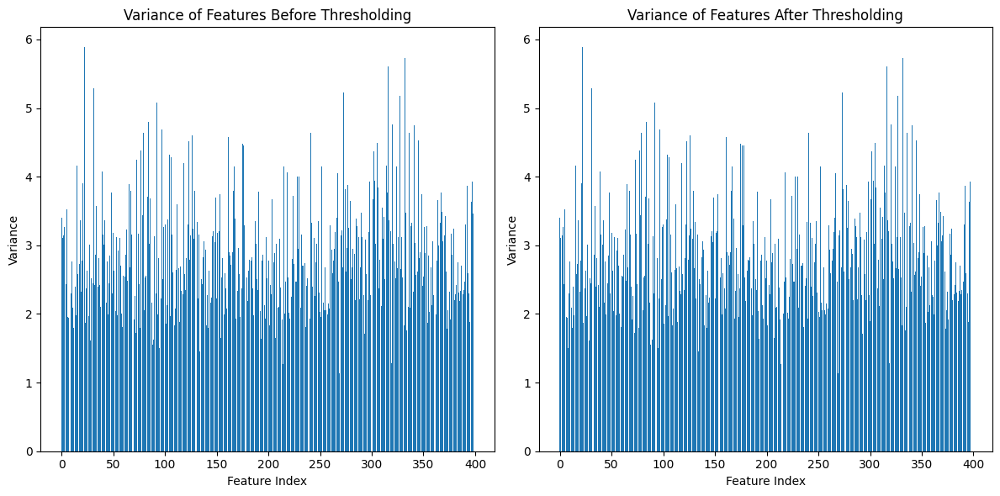

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate variance of each feature before variance thresholding
variances_before = np.var(features, axis=0)

# Apply variance thresholding again just for visualization
selector = VarianceThreshold(threshold=0.2)
reduced_features = selector.fit_transform(features)

# Calculate variance of selected features after variance thresholding
variances_after = np.var(reduced_features, axis=0)

# Plotting variances before and after variance thresholding
plt.figure(figsize=(12, 6))

# Before variance thresholding
plt.subplot(1, 2, 1)
plt.bar(range(len(variances_before)), variances_before)
plt.title('Variance of Features Before Thresholding')
plt.xlabel('Feature Index')
plt.ylabel('Variance')

# After variance thresholding
plt.subplot(1, 2, 2)
plt.bar(range(len(variances_after)), variances_after)
plt.title('Variance of Features After Thresholding')
plt.xlabel('Feature Index')
plt.ylabel('Variance')

plt.tight_layout()
plt.show()


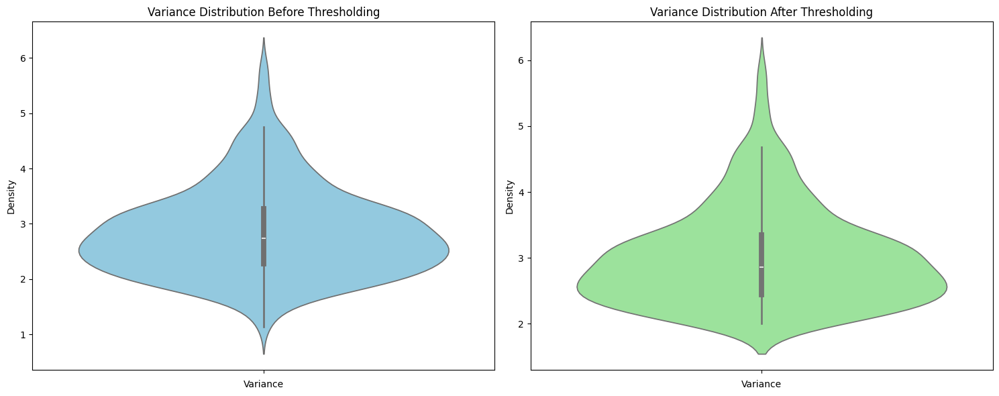

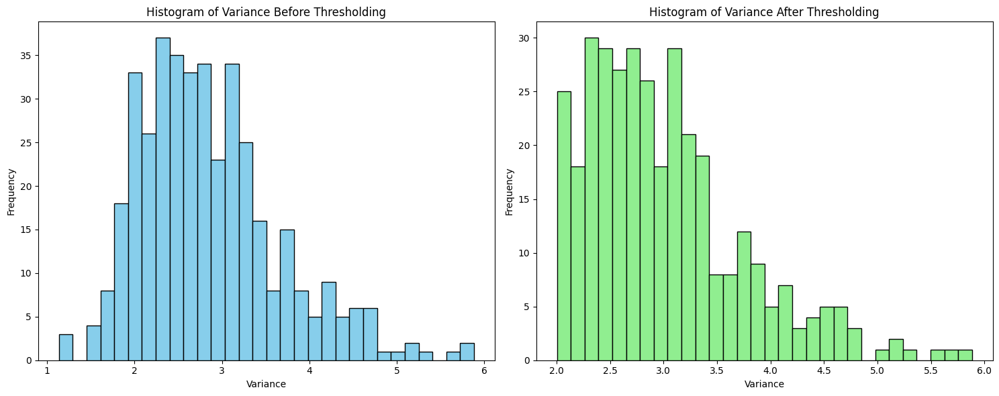

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculate variances
variances_before = np.var(features, axis=0)
selector = VarianceThreshold(threshold=2)
reduced_features = selector.fit_transform(features)
variances_after = np.var(reduced_features, axis=0)

# Create a figure for the combined plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Violin plot of variances before thresholding
sns.violinplot(variances_before, ax=ax1, color="skyblue")
ax1.set_title('Variance Distribution Before Thresholding')
ax1.set_xlabel('Variance')
ax1.set_ylabel('Density')

# Violin plot of variances after thresholding
sns.violinplot(variances_after, ax=ax2, color="lightgreen")
ax2.set_title('Variance Distribution After Thresholding')
ax2.set_xlabel('Variance')
ax2.set_ylabel('Density')

plt.tight_layout()
plt.show()

# Histograms for a detailed view
fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(15, 6))

# Histogram of variances before thresholding
ax3.hist(variances_before, bins=30, color='skyblue', edgecolor='black')
ax3.set_title('Histogram of Variance Before Thresholding')
ax3.set_xlabel('Variance')
ax3.set_ylabel('Frequency')

# Histogram of variances after thresholding
ax4.hist(variances_after, bins=30, color='lightgreen', edgecolor='black')
ax4.set_title('Histogram of Variance After Thresholding')
ax4.set_xlabel('Variance')
ax4.set_ylabel('Frequency')

plt.tight_layout()
plt.show()


**Variance Thresholding in Feature Selection: Analysis**

In our feature selection process for GIF description, we applied **Variance Thresholding** to reduce the feature set by removing features with low variability. Features with low variance (close to 1.0) contribute little to model learning as they show little difference across GIFs. In this analysis, we applied a threshold of 2.0 to filter out low-variance features.

Before applying the threshold (top-left plot), the variance of features ranged widely from 1.0 to 5.5, with most features clustered between 2.0 and 3.5. After thresholding, as shown in the bottom-right plot, only features with variance greater than 2.0 were retained. Specifically, the number of features with variance below 2.0 dropped significantly, leaving us with higher-quality features concentrated between 2.5 and 5.5. For example, features that originally had a variance of 1.5 were removed, as they likely provided little differentiating power for the GIF description model.

This method is particularly beneficial in our project for two main reasons: first, it reduces the dimensionality of the dataset, improving the efficiency of training models like C3D and I3D. Second, by focusing on features with higher variance, we increase the likelihood that the remaining features will be informative for capturing meaningful patterns in GIFs, such as movement, background, or emotion. In the context of model building, this ensures that the models are not overwhelmed by noise, leading to better performance and faster training times.